# YOLOv8 oriented bounding box detection model

## Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
!nvidia-smi

Sat Jan  4 13:26:05 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   36C    P8               9W /  70W |      0MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [ ]:
import os
HOME = os.getcwd()
print(HOME)

/content/datasets


## Install YOLOv8

To install YOL0v8, run the following command:

In [ ]:
!pip install ultralytics -q

import ultralytics
ultralytics.checks()

Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
Setup complete ✅ (8 CPUs, 51.0 GB RAM, 32.7/235.7 GB disk)


Now, we can import YOLOv8 into our Notebook:

In [ ]:
from ultralytics import YOLO

from IPython.display import display, Image

# Downloading Improvised Dataset from ROBOFLOW

In [ ]:
!pip install roboflow

from roboflow import Roboflow
rf = Roboflow(api_key="mcuHKCRqTXfrfVWvXOnv")
project = rf.workspace("stillwater81").project("ship-image-detection")
version = project.version(3)
dataset = version.download("yolov8-obb")


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.5/81.5 kB 4.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 6.4 MB/s eta 0:00:00
  Attempting uninstall: idna
    Found existing installation: idna 3.10
    Uninstalling idna-3.10:
      Successfully uninstalled idna-3.10
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Ship-image-detection-3 in yolov8-obb:: 100%|██████████| 32518/32518 [00:03<00:00, 8340.31it/s]


In [ ]:
!mkdir {HOME}/datasets
%cd {HOME}/datasets

!pip install roboflow --quiet

from roboflow import Roboflow
rf = Roboflow(api_key="mcuHKCRqTXfrfVWvXOnv")
project = rf.workspace("stillwater81").project("ship-image-detection")
version = project.version(3)
dataset = version.download("yolov8-obb")

import yaml

with open(f'{dataset.location}/data.yaml', 'r') as file:
    data = yaml.safe_load(file)

data['path'] = dataset.location

with open(f'{dataset.location}/data.yaml', 'w') as file:
    yaml.dump(data, file, sort_keys=False)

/content/datasets
loading Roboflow workspace...
loading Roboflow project...



Extracting Dataset Version Zip to Ship-image-detection-3 in yolov8-obb:: 100%|██████████| 32518/32518 [00:03<00:00, 8187.92it/s]


## Train a YOLOv8 OBB Object Detection Model

With our dataset downloaded, we can now train a YOLOv8 OBB object detection model. Run the code snippet below to start training your model:

In [ ]:

# Adjust Data Paths
HOME = os.getcwd()
# dataset_path was previously: f"{HOME}/datasets/Ship-image-detection-3"
# Removing the extra 'datasets' directory from the path
dataset_path = f"{HOME}/Ship-image-detection-3"

# Validate and Fix Data YAML
with open(f'{dataset_path}/data.yaml', 'r') as file:
    data = yaml.safe_load(file)

data['path'] = dataset_path

with open(f'{dataset_path}/data.yaml', 'w') as file:
    yaml.dump(data, file, sort_keys=False)


# Initialize Model
model = YOLO('yolov8m-obb.pt')  # Use a larger YOLOv8 model

# Fine-tune Model Training
results = model.train(
    data=f"{dataset_path}/data.yaml",  # Dataset configuration
    epochs=100,                         # Increase training epochs
    imgsz=640,                        # Higher resolution for finer details
    batch=16,                          # Fixed batch size
    optimizer='SGD',                   # Experiment with SGD optimizer
    lr0=0.01,                          # Adjust initial learning rate
    lrf=0.1,                           # Higher final learning rate decay
    momentum=0.937,                    # Momentum for SGD
    weight_decay=0.0001,               # Reduce weight decay
    label_smoothing=0.1,               # Label smoothing for robustness
    mosaic=0.5,                        # Balanced mosaic augmentation
    mixup=0.3,                         # Mixup augmentation
    hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, # Augmentations for better variability
    translate=0.1, scale=0.5, degrees=45, # Advanced geometric augmentations
    close_mosaic=5,                    # Close mosaic earlier
    workers=4,                         # Data loader workers
    device=0                           # GPU device
)

# Evaluate Model
metrics = model.val(
    data=f"{dataset_path}/data.yaml",
    conf=0.1,                          # Lower confidence threshold for evaluation
    iou=0.5,                           # Intersection-over-union threshold
    plots=True                         # Generate validation plots
)

# Print Metrics
print(f"Precision: {metrics.box.p}")
print(f"Recall: {metrics.box.r}")
print(f"mAP@50: {metrics.box.map50}")
print(f"mAP@50-95: {metrics.box.map}")


100%|██████████| 50.9M/50.9M [00:00<00:00, 70.5MB/s]


WARNING ⚠️ 'label_smoothing' is deprecated and will be removed in in the future.
Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=obb, mode=train, model=yolov8m-obb.pt, data=/content/datasets/Ship-image-detection-3/data.yaml, epochs=100, time=None, patience=100, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=0, workers=4, project=None, name=train, exist_ok=False, pretrained=True, optimizer=SGD, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=5, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, multi_scale=False, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, embed=None, show=False, save_frames

100%|██████████| 755k/755k [00:00<00:00, 21.2MB/s]


Overriding model.yaml nc=15 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 5.35M/5.35M [00:00<00:00, 95.0MB/s]


AMP: checks passed ✅


train: Scanning /content/datasets/Ship-image-detection-3/train/labels... 13492 images, 475 backgrounds, 3 corrupt: 100%|██████████| 13492/13492 [00:12<00:00, 1098.42it/s]

train: WARNING ⚠️ /content/datasets/Ship-image-detection-3/train/images/1__20180714_180427_1029__-118-21100741654266_33-732092454738826_png_jpg.rf.2c67481f2780301aaae15dd35c28c228.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.3107      1.1414]
train: WARNING ⚠️ /content/datasets/Ship-image-detection-3/train/images/1__20180714_180427_1029__-118-21100741654266_33-732092454738826_png_jpg.rf.d4ee2743606c9227ab111d46fa73f547.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.2976      1.1415]
train: WARNING ⚠️ /content/datasets/Ship-image-detection-3/train/images/SK_195_jpg.rf.6b4cc798fded9f48f790f6a721053aa2.jpg: ignoring corrupt image/label: non-normalized or out of bounds coordinates [     1.0039]


train: New cache created: /content/datasets/Ship-image-detection-3/train/labels.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))


A new version of Albumentations is available: 1.4.24 (you have 1.4.20). Upgrade using: pip install -U albumentations. To disable automatic update checks, set the environment variable NO_ALBUMENTATIONS_UPDATE to 1.
val: Scanning /content/datasets/Ship-image-detection-3/valid/labels... 1517 images, 17 backgrounds, 0 corrupt: 100%|██████████| 1517/1517 [00:01<00:00, 973.91it/s] 


val: New cache created: /content/datasets/Ship-image-detection-3/valid/labels.cache
Plotting labels to runs/obb/train/labels.jpg... 
optimizer: SGD(lr=0.01, momentum=0.937) with parameter groups 83 weight(decay=0.0), 93 weight(decay=0.0001), 92 bias(decay=0.0)
TensorBoard: model graph visualization added ✅
Image sizes 640 train, 640 val
Using 4 dataloader workers
Logging results to runs/obb/train
Starting training for 100 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      1/100       7.3G      1.721      1.766      2.463          2        640: 100%|██████████| 844/844 [07:23<00:00,  1.90it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.693      0.562      0.557      0.298



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      2/100      7.06G      1.581      1.228      2.305         13        640: 100%|██████████| 844/844 [07:22<00:00,  1.91it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.02it/s]

                   all       1517       2711      0.666      0.561      0.551      0.288



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      3/100      6.96G      1.592      1.247      2.297          4        640: 100%|██████████| 844/844 [07:20<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.01it/s]

                   all       1517       2711      0.635      0.579       0.55      0.309



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      4/100      7.01G      1.625      1.301      2.308          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:24<00:00,  3.93it/s]

                   all       1517       2711      0.688      0.571      0.541      0.286



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      5/100      6.99G       1.61      1.289      2.312          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  3.96it/s]

                   all       1517       2711      0.642      0.548      0.525      0.267



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      6/100      6.95G      1.589      1.254      2.264          1        640: 100%|██████████| 844/844 [07:19<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  3.97it/s]

                   all       1517       2711      0.646      0.558      0.537      0.296



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      7/100         7G      1.553      1.218      2.236          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.679      0.597      0.577      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      8/100      6.99G      1.534      1.212      2.205          1        640: 100%|██████████| 844/844 [07:19<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.01it/s]

                   all       1517       2711      0.664      0.579      0.567      0.316



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      9/100      7.85G      1.519      1.194      2.198          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.01it/s]

                   all       1517       2711      0.624      0.562      0.541      0.308



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     10/100      6.96G      1.503      1.186      2.189          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.687      0.592      0.573      0.343



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     11/100      6.97G      1.483      1.156      2.173          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.701      0.589      0.586      0.351



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     12/100      6.95G      1.474      1.159      2.151          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.668      0.605      0.585      0.337



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     13/100      6.92G      1.456       1.13      2.138          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.677      0.584       0.57      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     14/100      6.98G      1.441       1.12      2.128          4        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.689      0.602      0.585      0.358



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     15/100      7.04G      1.439      1.111      2.114          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.691      0.605      0.595      0.371



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     16/100      6.96G      1.413      1.107      2.095          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.692      0.588      0.586      0.359



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     17/100      7.45G      1.409      1.096      2.087          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.717      0.595      0.602       0.37



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     18/100      6.95G      1.395      1.079      2.071          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.673       0.61       0.59      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     19/100      7.04G      1.385      1.079      2.073         11        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.701       0.61      0.605       0.38



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     20/100      7.01G      1.377      1.073       2.05          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.02it/s]

                   all       1517       2711      0.698      0.595      0.586      0.362



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     21/100      6.94G      1.369      1.064      2.038          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.701      0.607      0.611      0.383



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     22/100      6.95G      1.356      1.049      2.039          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.01it/s]

                   all       1517       2711      0.663      0.608      0.595      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     23/100      6.99G      1.355      1.054      2.032          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.02it/s]

                   all       1517       2711      0.702      0.613      0.607       0.39



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     24/100      6.99G      1.347      1.045      2.031          8        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.693      0.605      0.606      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     25/100      7.01G      1.335      1.044      2.021          7        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.691      0.606      0.595      0.374



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     26/100      7.06G      1.334       1.04      2.007          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.694      0.605      0.606      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     27/100      6.95G      1.321      1.023      1.996          0        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.713      0.606      0.609      0.384



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     28/100      6.93G       1.31      1.018      1.989          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.711      0.599      0.609      0.385



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     29/100      7.06G      1.307       1.01      1.988          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.718      0.603      0.613      0.398



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     30/100      6.96G      1.299      1.008      1.955          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.709      0.602       0.61      0.405



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     31/100      6.95G      1.296      1.004      1.975         25        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.716      0.612      0.616      0.406



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     32/100      6.95G      1.282     0.9873      1.959          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.718      0.609      0.612        0.4



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     33/100      6.95G      1.285     0.9944       1.96          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711       0.71      0.611      0.608      0.397



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     34/100      7.56G      1.275     0.9767      1.947          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.706      0.613      0.614      0.399



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     35/100      6.98G      1.267     0.9773      1.951          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.717      0.606      0.623      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     36/100      7.03G      1.265     0.9732       1.94          7        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.716      0.615      0.621      0.408



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     37/100      6.94G      1.257     0.9756      1.949         20        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.714      0.611      0.624      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     38/100      6.96G      1.249     0.9659      1.929          4        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.722      0.609      0.626      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     39/100      6.94G      1.238     0.9533       1.92          5        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.718      0.613      0.625      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     40/100      6.95G      1.248     0.9616      1.931          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.726      0.609      0.628      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     41/100      6.95G      1.237     0.9562      1.925          7        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.711      0.619       0.62      0.411



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     42/100      6.95G      1.237     0.9442      1.909          2        640: 100%|██████████| 844/844 [07:19<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.725       0.61      0.625      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     43/100      6.95G       1.23     0.9525      1.909          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.711      0.616      0.625      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     44/100      6.95G       1.23     0.9596      1.908          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.705      0.624      0.619      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     45/100      7.57G      1.214     0.9311      1.891          4        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711       0.72      0.613      0.625      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     46/100      6.98G      1.209     0.9336      1.894          5        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.719       0.61      0.625      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     47/100      6.91G      1.207     0.9408      1.889          0        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.713      0.615      0.627      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     48/100      6.95G      1.201     0.9225      1.884          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.724      0.615      0.632      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     49/100      6.95G      1.189     0.9126      1.865          5        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.713      0.622      0.631       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     50/100      6.94G       1.19     0.9137      1.859          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.719       0.62      0.626      0.413



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     51/100      6.96G       1.19     0.9205       1.87          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.717      0.617      0.622      0.412



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     52/100      7.07G      1.185     0.9118       1.87          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.718       0.62      0.626      0.417



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     53/100      6.97G      1.184     0.9174       1.86          0        640: 100%|██████████| 844/844 [07:19<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.722      0.612      0.627      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     54/100      6.95G      1.176     0.9062      1.856          2        640: 100%|██████████| 844/844 [07:19<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.724      0.614      0.628      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     55/100      7.47G      1.159     0.8897      1.847          1        640: 100%|██████████| 844/844 [07:19<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.722      0.619      0.627      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     56/100      6.99G      1.156     0.8884      1.837          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711       0.72      0.619      0.629      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     57/100      7.45G      1.164     0.8968      1.854          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.716      0.617      0.626      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     58/100      7.05G       1.16     0.8964      1.848          5        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.724      0.616      0.626      0.418



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     59/100      6.95G      1.162     0.8997      1.845          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.719      0.619      0.629      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     60/100      6.86G      1.152     0.8902      1.823          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.722      0.621      0.627      0.421



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     61/100      6.95G      1.148     0.8858      1.821          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.718       0.62      0.626       0.42



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     62/100      6.95G      1.142     0.8813      1.824          1        640: 100%|██████████| 844/844 [07:19<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.721      0.623      0.626      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     63/100      6.95G      1.143      0.879      1.817          4        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.715      0.624      0.627      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     64/100      6.95G      1.133     0.8721      1.812          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.02it/s]

                   all       1517       2711      0.719      0.619      0.625      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     65/100      6.95G      1.129     0.8766      1.812          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.714      0.621      0.626      0.422



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     66/100      6.96G      1.123      0.859      1.813          7        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.713      0.619      0.628      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     67/100      7.07G      1.114     0.8629      1.799          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.712      0.615      0.628      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     68/100      6.98G       1.12     0.8632      1.791          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.714      0.618      0.627      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     69/100      6.94G       1.11     0.8578      1.788          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.715      0.618      0.625      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     70/100      6.91G      1.119     0.8542      1.794          8        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.03it/s]

                   all       1517       2711      0.716      0.615      0.626      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     71/100       7.5G      1.096     0.8345      1.779          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.714       0.62      0.625      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     72/100      7.03G      1.099      0.848       1.77          0        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.714      0.617      0.624      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     73/100      6.99G      1.088     0.8467      1.771          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.717      0.616      0.624      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     74/100      6.94G      1.106     0.8512      1.775          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.722      0.611      0.622      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     75/100      6.93G      1.101     0.8485      1.782          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711       0.72      0.611      0.622      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     76/100      6.94G      1.089     0.8332      1.763          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.714      0.615      0.623      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     77/100      6.95G      1.083     0.8312      1.762          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.714      0.618      0.624      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     78/100       7.1G      1.083     0.8282      1.761          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.714      0.619      0.624      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     79/100      6.95G      1.078     0.8332      1.753          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.714      0.619      0.626      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     80/100      6.96G      1.079     0.8256      1.744          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.714      0.619      0.626      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     81/100      6.93G      1.074     0.8311      1.747          2        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.713       0.62      0.626      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     82/100      6.95G      1.054     0.8096      1.733          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.711      0.619      0.625      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     83/100      7.02G      1.061     0.8161      1.737          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.712      0.618      0.625      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     84/100      6.93G      1.055     0.8071      1.722          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.714      0.617      0.626      0.425



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     85/100      6.94G      1.057      0.813      1.729          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.715      0.619      0.627      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     86/100      6.86G      1.054     0.8131       1.73          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.718      0.619      0.627      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     87/100      6.95G      1.049     0.8094      1.721          0        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.718      0.618      0.626      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     88/100       7.2G      1.045     0.8077      1.734          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.714      0.622      0.625      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     89/100      6.98G      1.048     0.8086      1.705          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.715      0.624      0.625      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     90/100      6.95G      1.037     0.7931      1.714          3        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.06it/s]

                   all       1517       2711      0.715      0.624      0.625      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     91/100      6.94G      1.034     0.7958      1.706          4        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.717      0.622      0.624      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     92/100      6.95G      1.033     0.7895      1.711          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.92it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.06it/s]

                   all       1517       2711      0.717      0.622      0.624      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     93/100      6.92G      1.024     0.7811       1.69          7        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.717       0.62      0.624      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     94/100      6.95G      1.028     0.7936      1.696          4        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.06it/s]

                   all       1517       2711      0.717       0.62      0.624      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     95/100      6.94G      1.025     0.7833        1.7          1        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.717      0.621      0.624      0.424


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01, num_output_channels=3, method='weighted_average'), CLAHE(p=0.01, clip_limit=(1.0, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     96/100      6.95G     0.8216     0.5775      1.425          0        640: 100%|██████████| 844/844 [07:18<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.04it/s]

                   all       1517       2711      0.716      0.622      0.624      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     97/100      6.95G     0.8108     0.5697      1.413          1        640: 100%|██████████| 844/844 [07:17<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.719      0.619      0.623      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     98/100      6.95G     0.8058     0.5638      1.413          1        640: 100%|██████████| 844/844 [07:17<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.06it/s]

                   all       1517       2711      0.718      0.619      0.623      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


     99/100      6.95G     0.8016     0.5599      1.405          1        640: 100%|██████████| 844/844 [07:17<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.717      0.619      0.623      0.423



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


    100/100      6.94G     0.7958     0.5584      1.399          1        640: 100%|██████████| 844/844 [07:17<00:00,  1.93it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:23<00:00,  4.05it/s]

                   all       1517       2711      0.717      0.619      0.623      0.423



100 epochs completed in 12.870 hours.
Optimizer stripped from runs/obb/train/weights/last.pt, 53.4MB
Optimizer stripped from runs/obb/train/weights/best.pt, 53.4MB

Validating runs/obb/train/weights/best.pt...
Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-obb summary (fused): 237 layers, 26,400,646 parameters, 0 gradients, 80.8 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:24<00:00,  3.95it/s]


                   all       1517       2711      0.715      0.617      0.626      0.425
Speed: 0.2ms preprocess, 9.9ms inference, 0.0ms loss, 1.8ms postprocess per image
Results saved to runs/obb/train
Ultralytics 8.3.57 🚀 Python-3.10.12 torch-2.5.1+cu121 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m-obb summary (fused): 237 layers, 26,400,646 parameters, 0 gradients, 80.8 GFLOPs


val: Scanning /content/datasets/Ship-image-detection-3/valid/labels.cache... 1517 images, 17 backgrounds, 0 corrupt: 100%|██████████| 1517/1517 [00:00<?, ?it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 95/95 [00:42<00:00,  2.23it/s]


                   all       1517       2711      0.714       0.63      0.692      0.502
Speed: 0.2ms preprocess, 22.3ms inference, 0.0ms loss, 1.7ms postprocess per image
Results saved to runs/obb/train2
Precision: [    0.71425]
Recall: [    0.63003]
mAP@50: 0.6917880343280244
mAP@50-95: 0.5015041908319682


Your model will train for 100 epochs. After training, you can run test your model using an image from your test set.

## Test the OBB Object Detection Model

Let's test our OBB detection model on an image:

In [ ]:
model = YOLO('/content/datasets/runs/obb/train/weights/best.pt')

import os
import random

random_file = random.choice(os.listdir(f"{dataset.location}/test/images"))
file_name = os.path.join(f"{dataset.location}/test/images", random_file)

results = model(file_name)

print(results[0])


image 1/1 /content/datasets/Ship-image-detection-3/test/images/s0163_png_jpg.rf.ed914408af70526cb76cc0d097d0bd91.jpg: 640x640 38.4ms
Speed: 2.0ms preprocess, 38.4ms inference, 3.3ms postprocess per image at shape (1, 3, 640, 640)
ultralytics.engine.results.Results object with attributes:

boxes: None
keypoints: None
masks: None
names: {0: 'ship'}
obb: ultralytics.engine.results.OBB object
orig_img: array([[[ 78,  65,  51],
        [ 62,  49,  35],
        [ 86,  73,  59],
        ...,
        [135, 121,  92],
        [163, 149, 120],
        [172, 158, 129]],

       [[ 94,  81,  67],
        [ 88,  75,  61],
        [ 96,  83,  69],
        ...,
        [139, 125,  96],
        [165, 151, 122],
        [175, 161, 132]],

       [[108,  95,  79],
        [115, 102,  86],
        [106,  93,  77],
        ...,
        [132, 118,  90],
        [149, 135, 107],
        [158, 144, 116]],

       ...,

       [[126, 125, 115],
        [127, 126, 116],
        [136, 134, 124],
        ...,
 

We can visualize our oriented bounding box predictions using the following code:

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.7/86.7 kB 3.0 MB/s eta 0:00:00


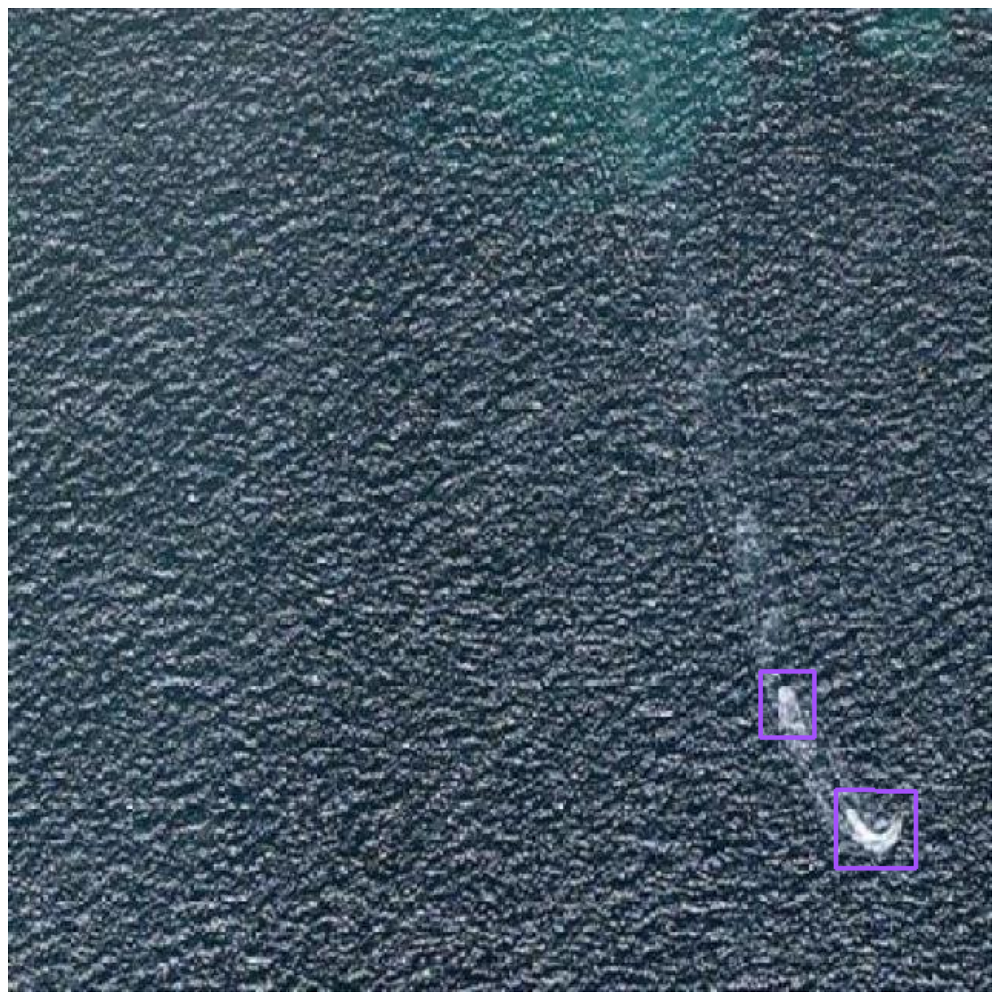

In [ ]:
!pip install supervision==0.18.0 -q

import supervision as sv
import cv2

detections = sv.Detections.from_ultralytics(results[0])

oriented_box_annotator = sv.OrientedBoxAnnotator()
annotated_frame = oriented_box_annotator.annotate(
    scene=cv2.imread(file_name),
    detections=detections
)

sv.plot_image(image=annotated_frame, size=(16, 16))

/content/datasets


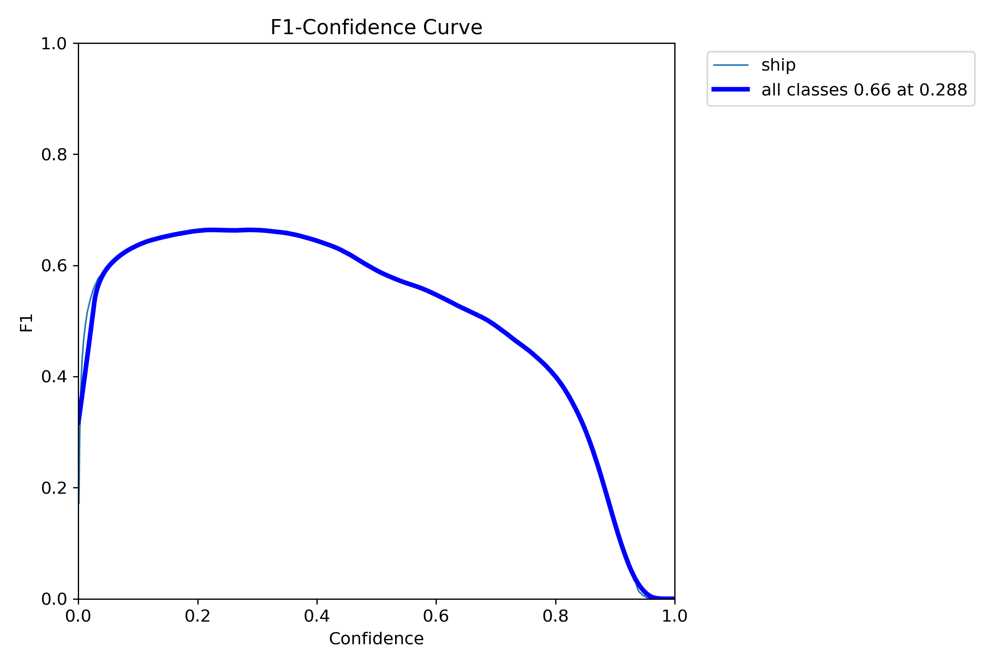

In [ ]:
# Removed the extra /content from the path
%cd {HOME}
# Updated path to remove the extra datasets directory
Image(filename=f'{HOME}/runs/obb/train/F1_curve.png', width=600)

/content/datasets


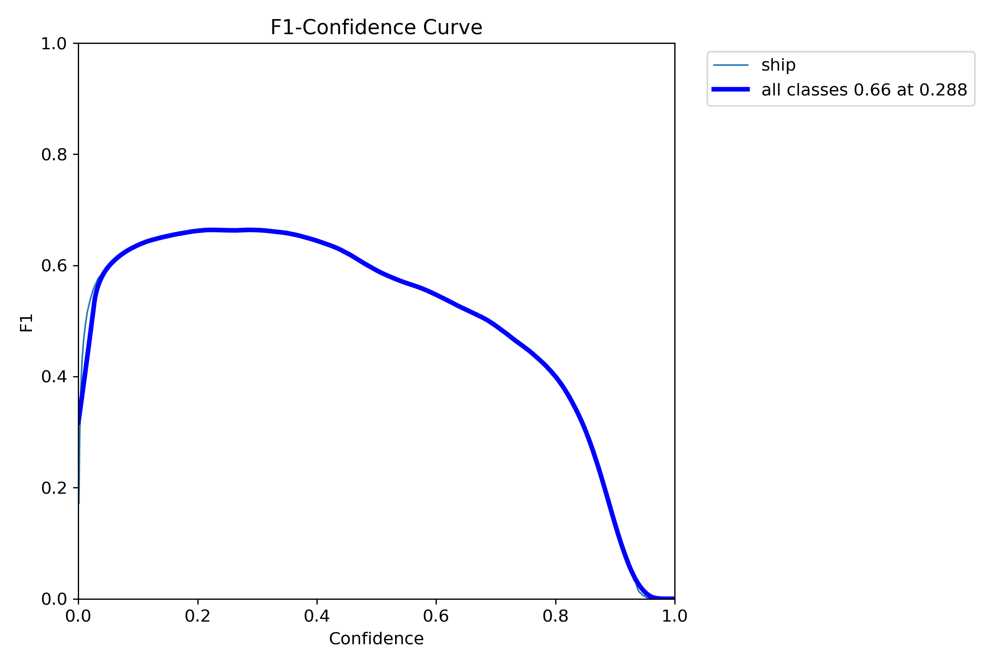

In [ ]:
# Removed the extra /content from the path
%cd {HOME}
# Updated path to remove the extra datasets directory
Image(filename=f'{HOME}/runs/obb/train/F1_curve.png', width=600)

/content/datasets


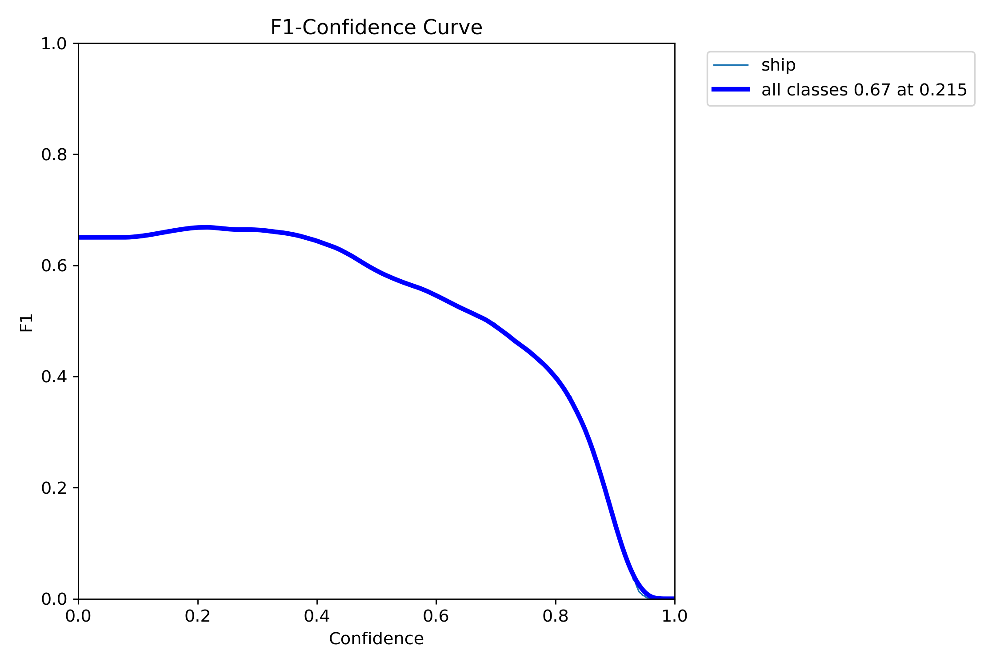

In [ ]:
# Removed the extra /content from the path
%cd {HOME}
# Updated path to remove the extra datasets directory
Image(filename=f'{HOME}/runs/obb/train2/F1_curve.png', width=600)

/content/datasets


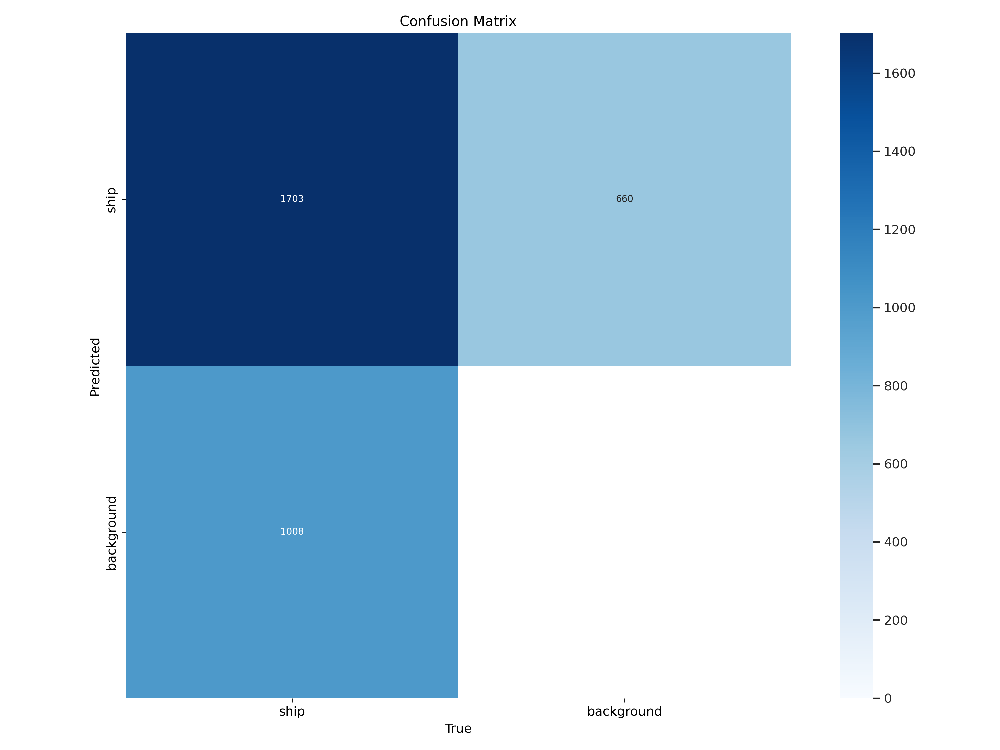

In [ ]:
%cd {HOME}
# Removed the extra /content from the path
Image(filename=f'{HOME}/runs/obb/train/confusion_matrix.png', width=600)

/content/datasets


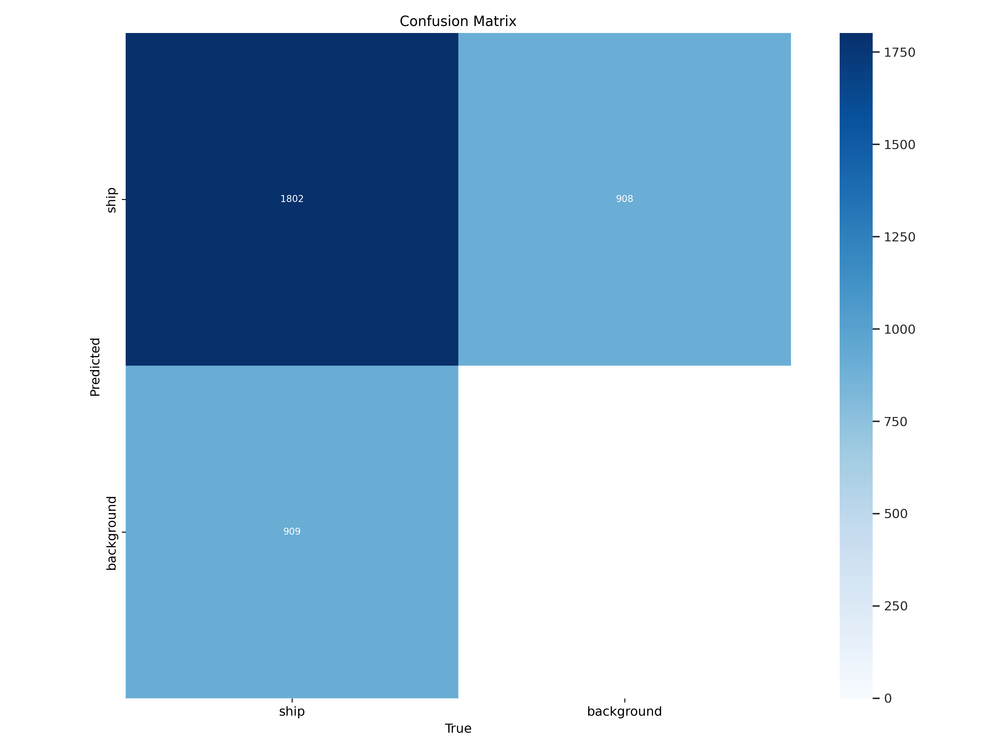

In [ ]:
%cd {HOME}
# Removed the extra /content from the path
Image(filename=f'{HOME}/runs/obb/train2/confusion_matrix.png', width=600)

/content/datasets


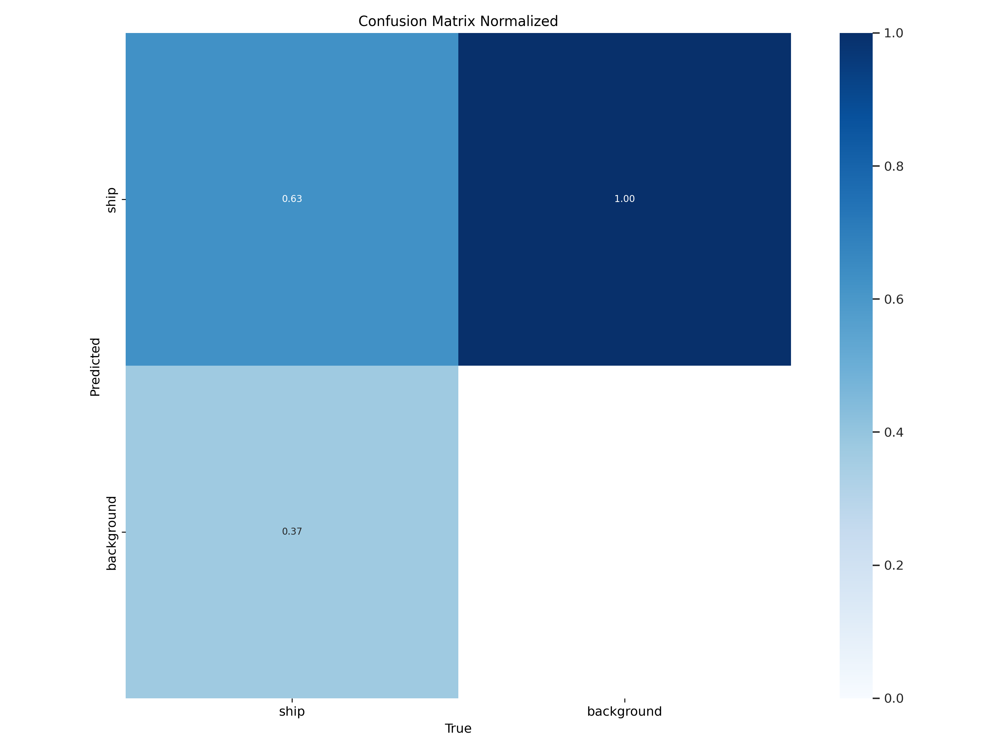

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/confusion_matrix_normalized.png', width=600)

/content/datasets


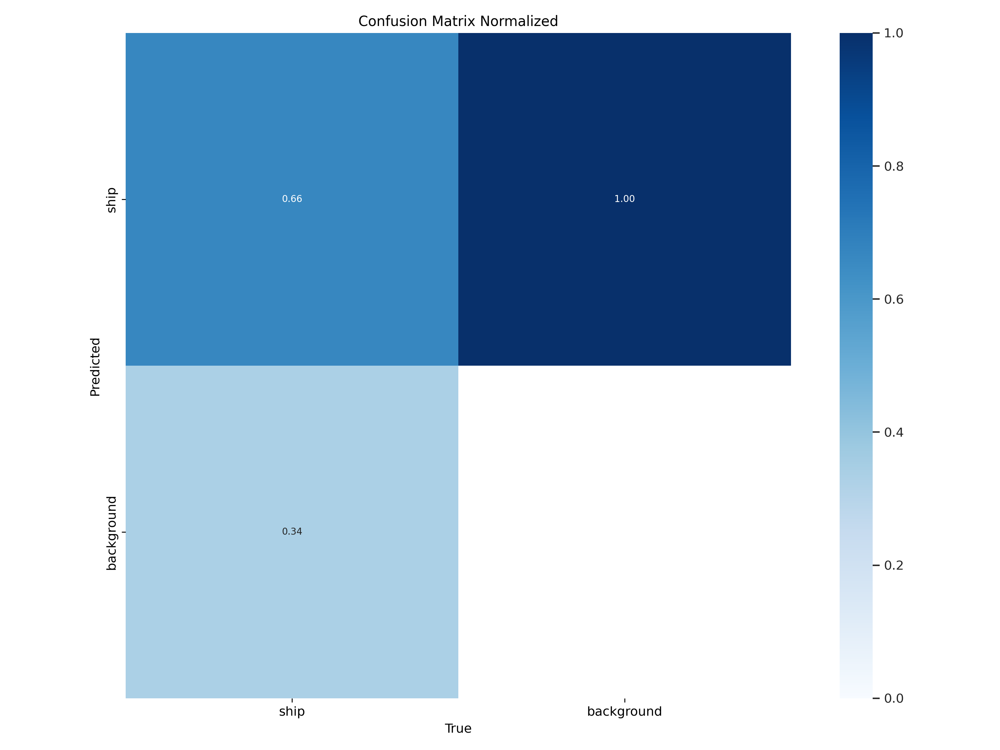

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train2/confusion_matrix_normalized.png', width=600)

/content/datasets


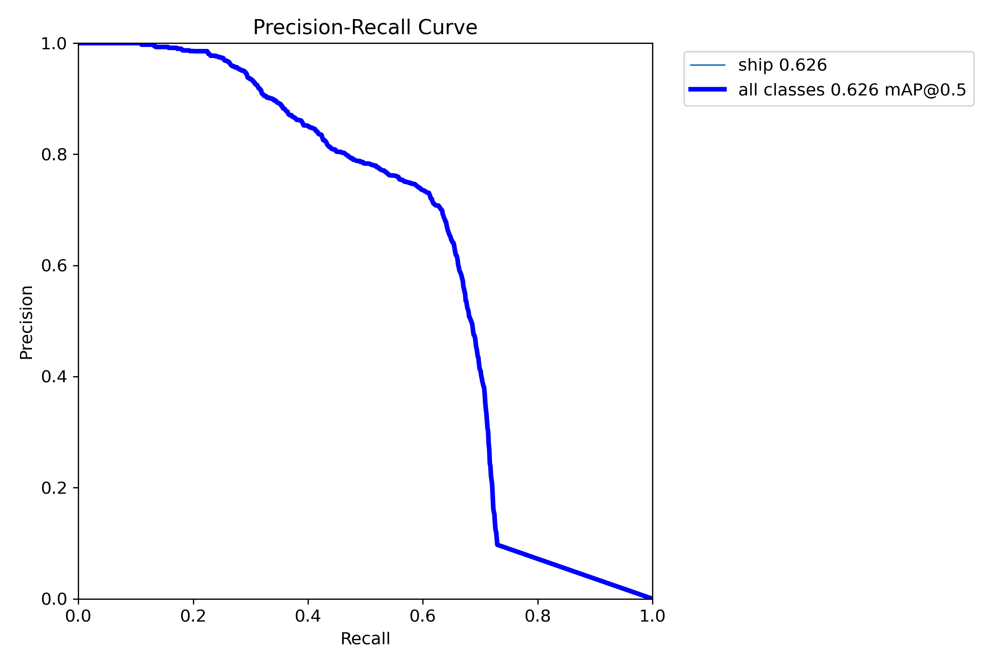

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/PR_curve.png', width=600)

/content/datasets


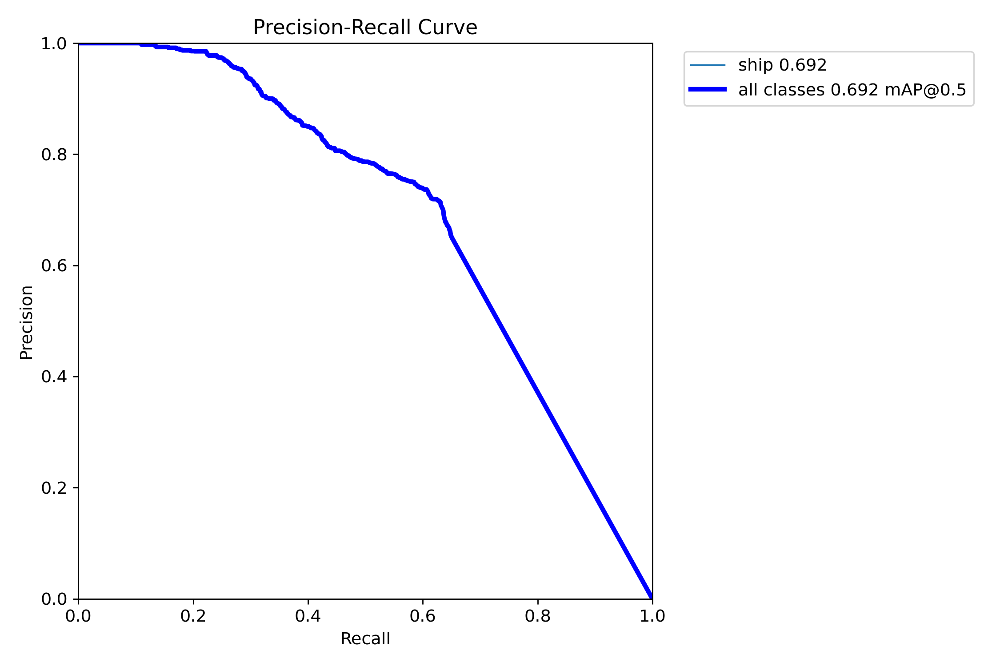

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train2/PR_curve.png', width=600)

/content/datasets


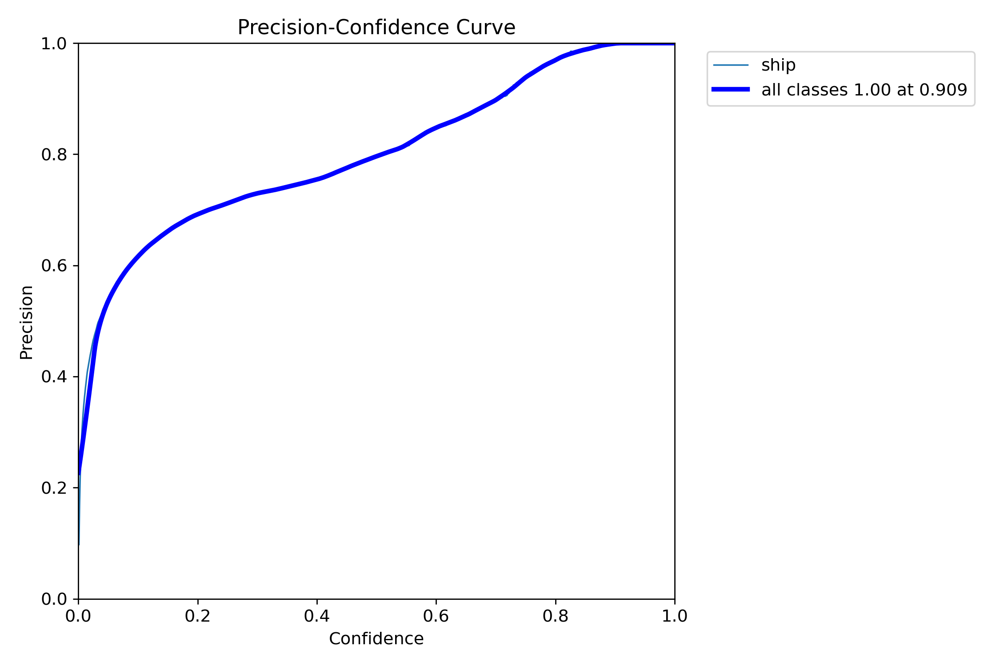

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/P_curve.png', width=600)

/content/datasets


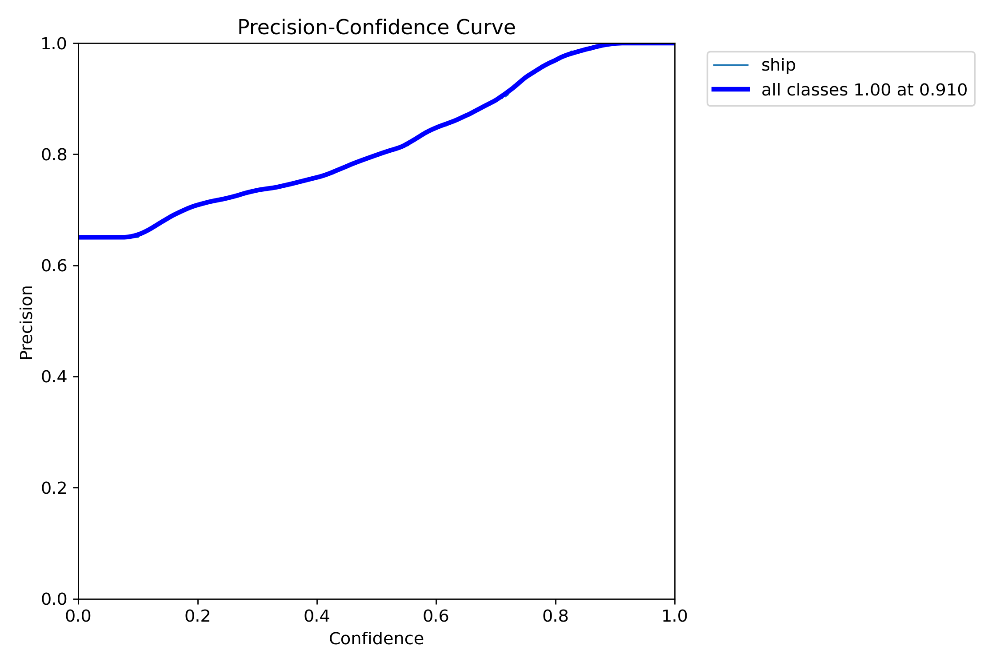

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train2/P_curve.png', width=600)

/content/datasets


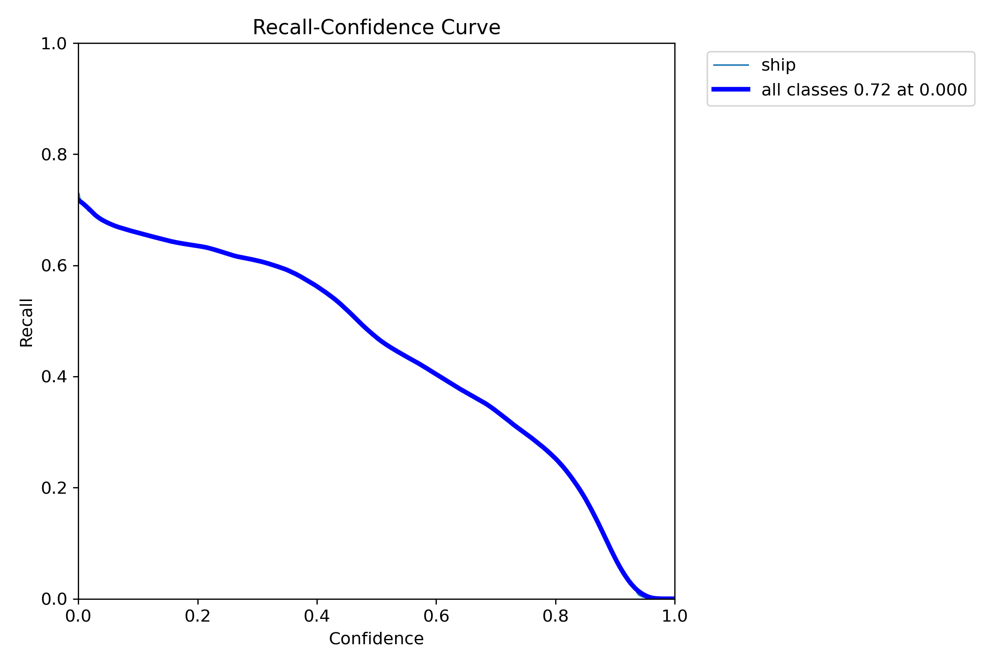

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/R_curve.png', width=600)

/content/datasets


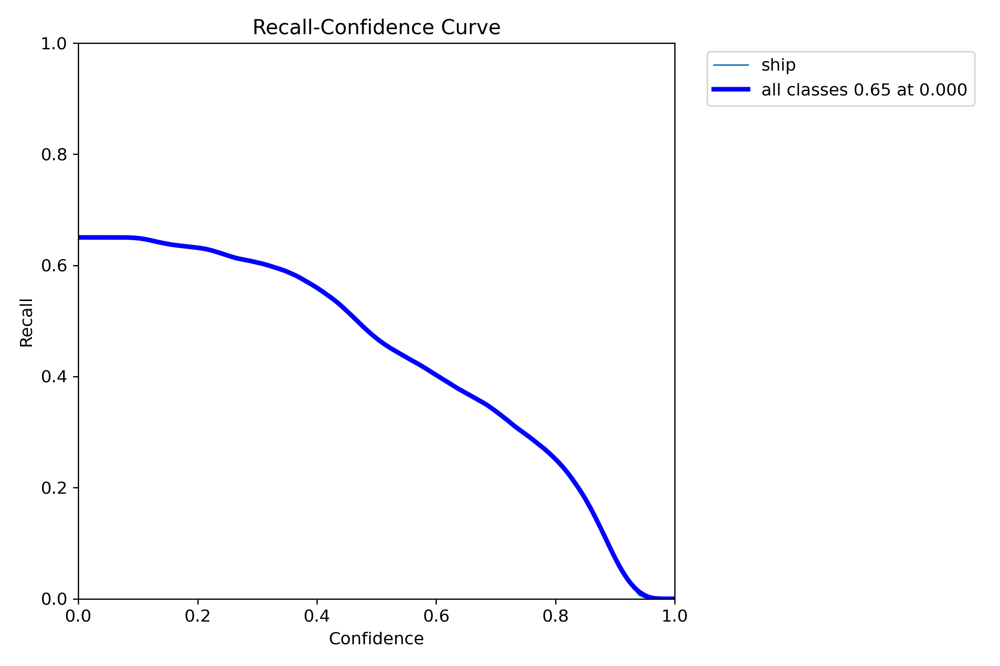

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train2/R_curve.png', width=600)

In [ ]:
# from IPython import get_ipython
from IPython.display import display, Image

# Assume HOME is the root directory of your project, where the 'runs' folder resides.
HOME = os.getcwd()

# Check if the 'runs' directory exists
if not os.path.exists(f"{HOME}/runs/obb/train2/labels.jpg"):
    print(f"WARNING: File not found: {HOME}/runs/obb/train2/labels.jpg")
else:
    display(Image(filename=f'{HOME}/runs/obb/train2/labels.jpg', width=600))

/content/datasets


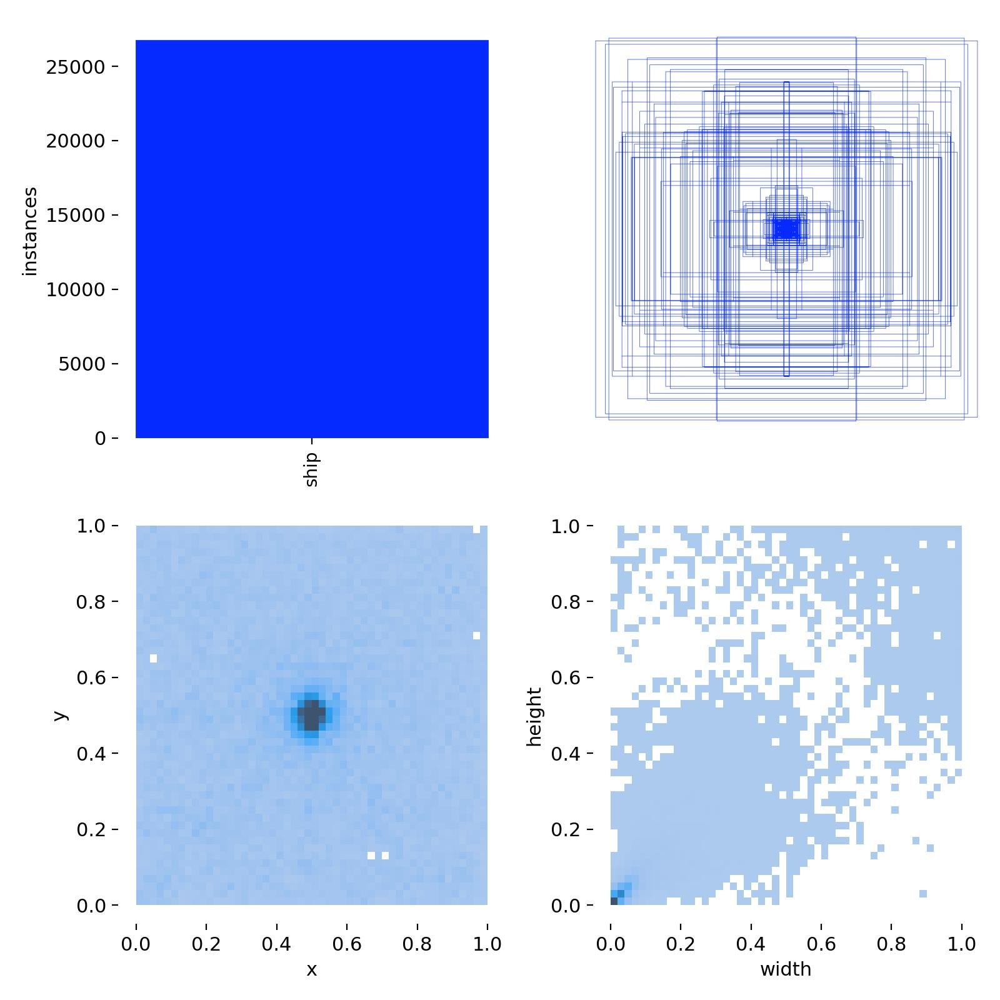

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/labels.jpg', width=600)

/content/datasets


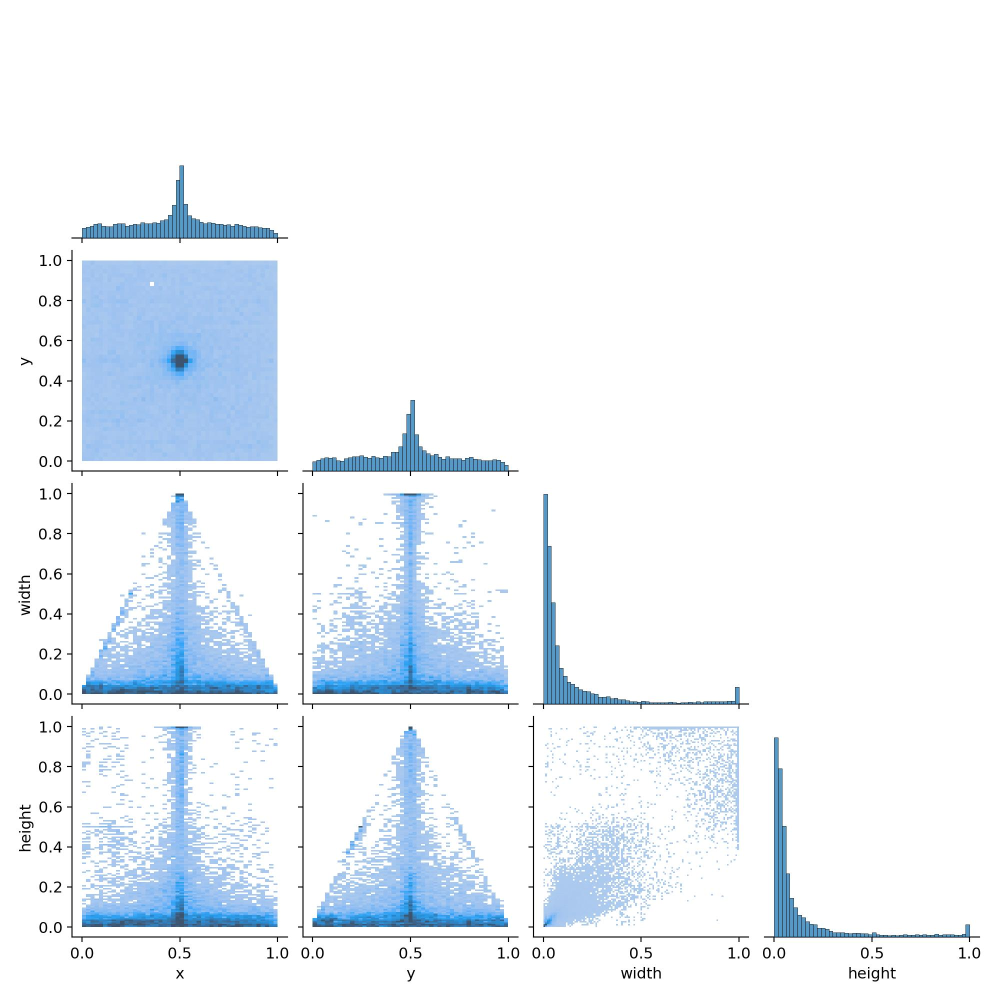

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/labels_correlogram.jpg', width=600)

/content/datasets


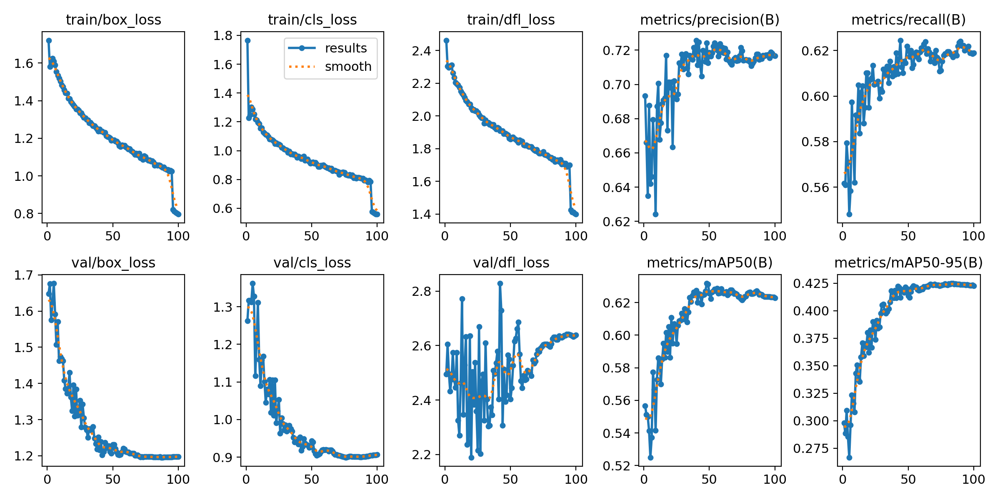

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/results.png', width=1000)

/content/datasets


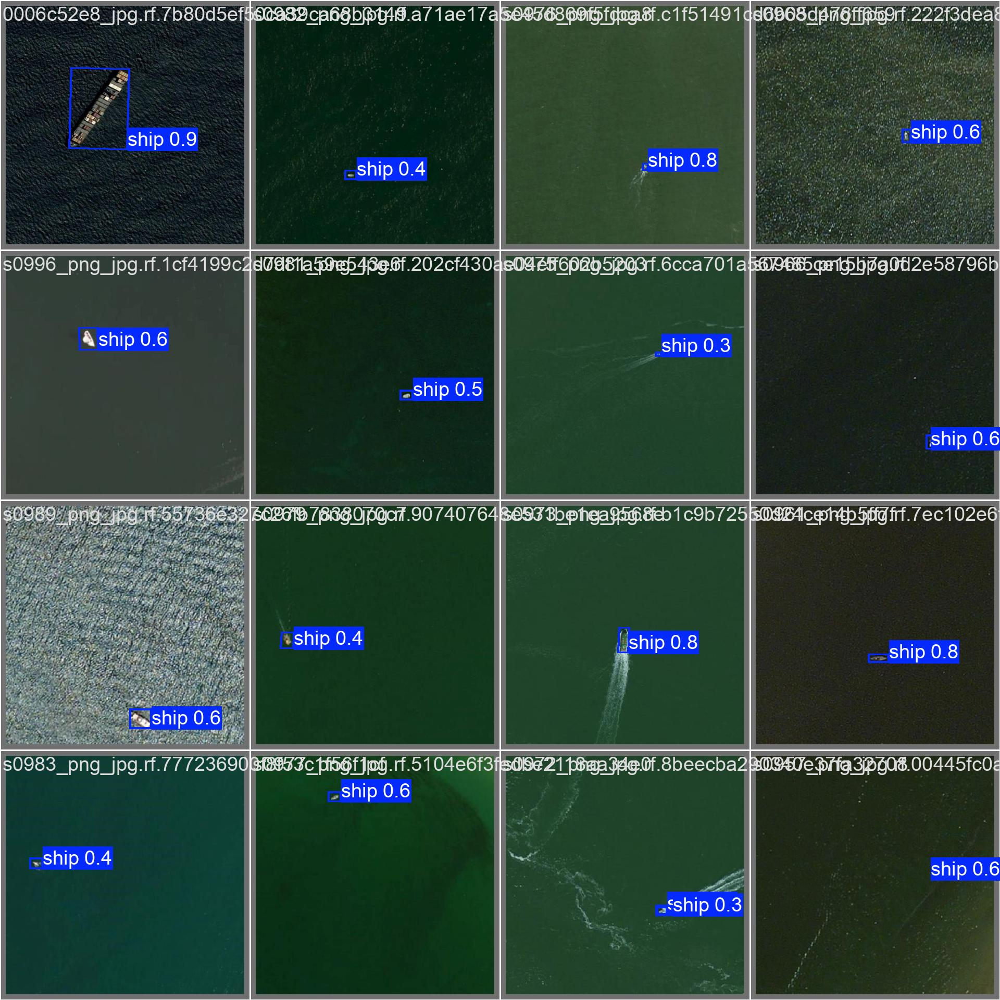

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/val_batch0_pred.jpg', width=800)

/content/datasets


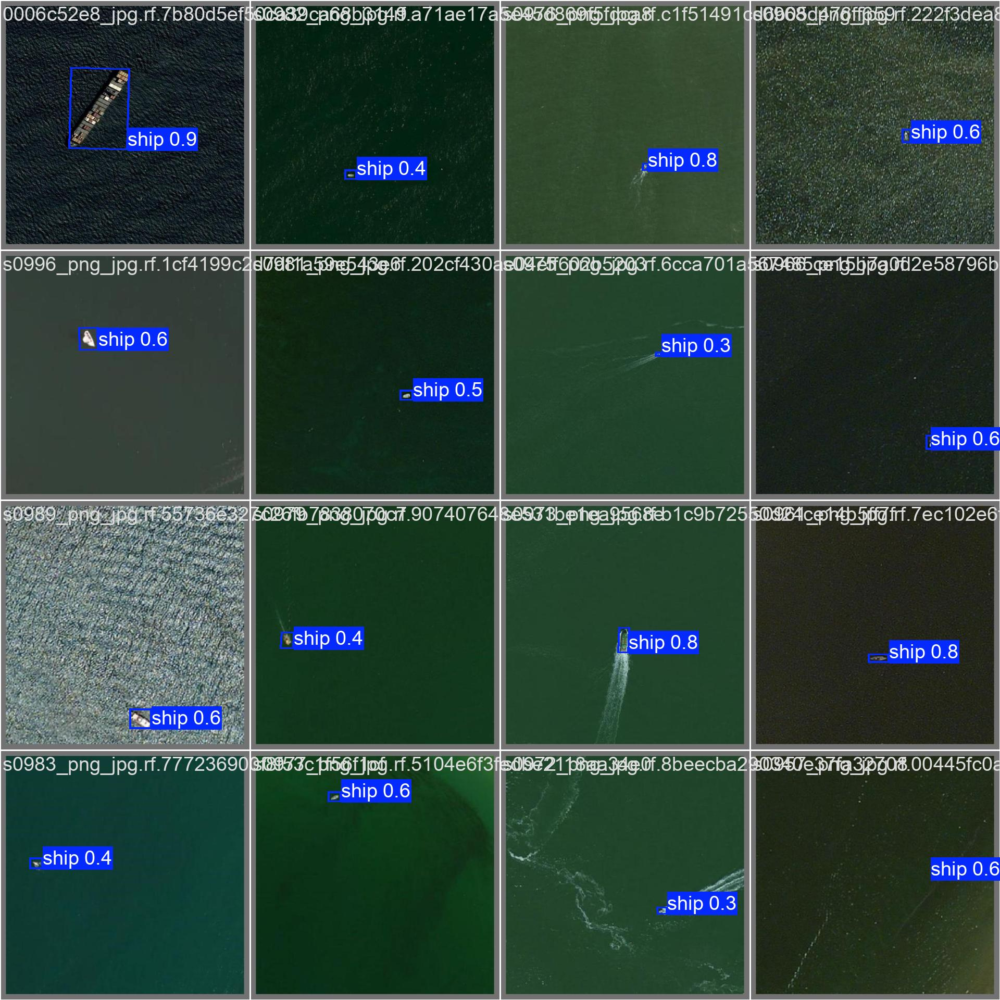

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train2/val_batch0_pred.jpg', width=800)

/content/datasets


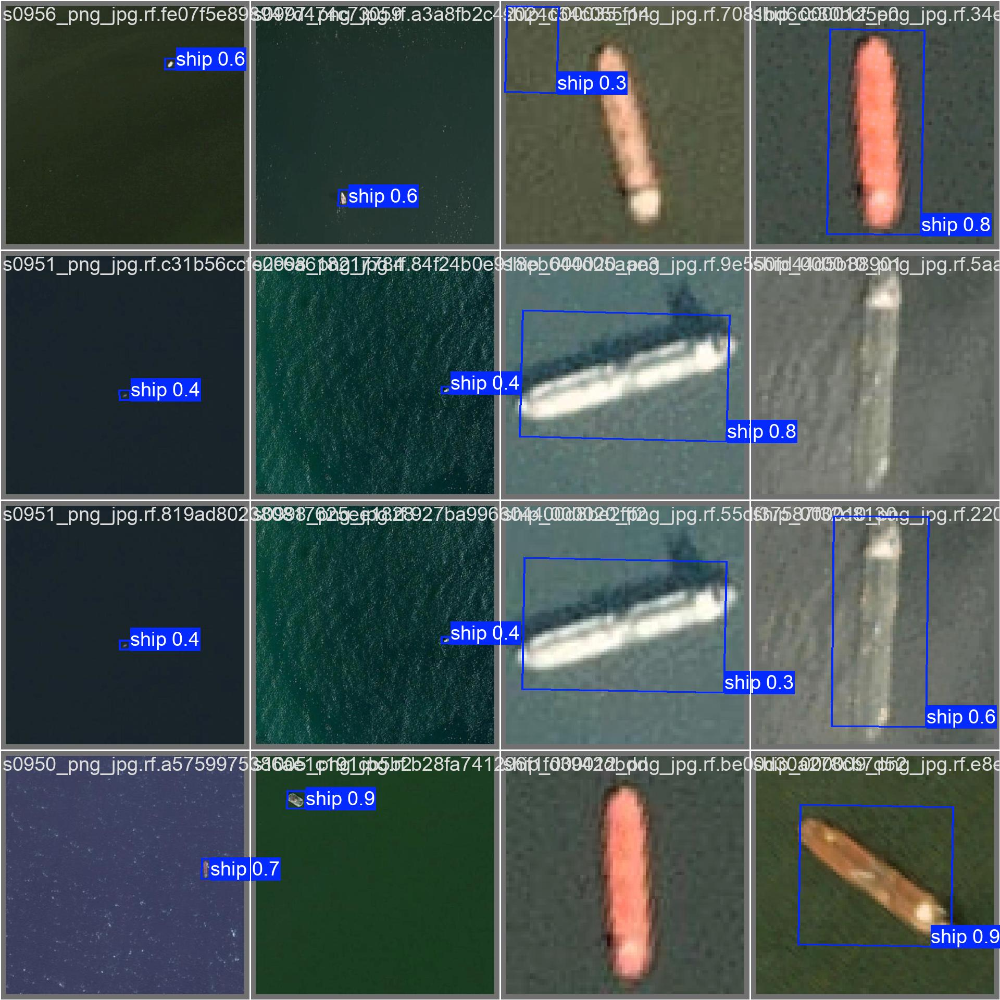

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/val_batch1_pred.jpg', width=800)

/content/datasets


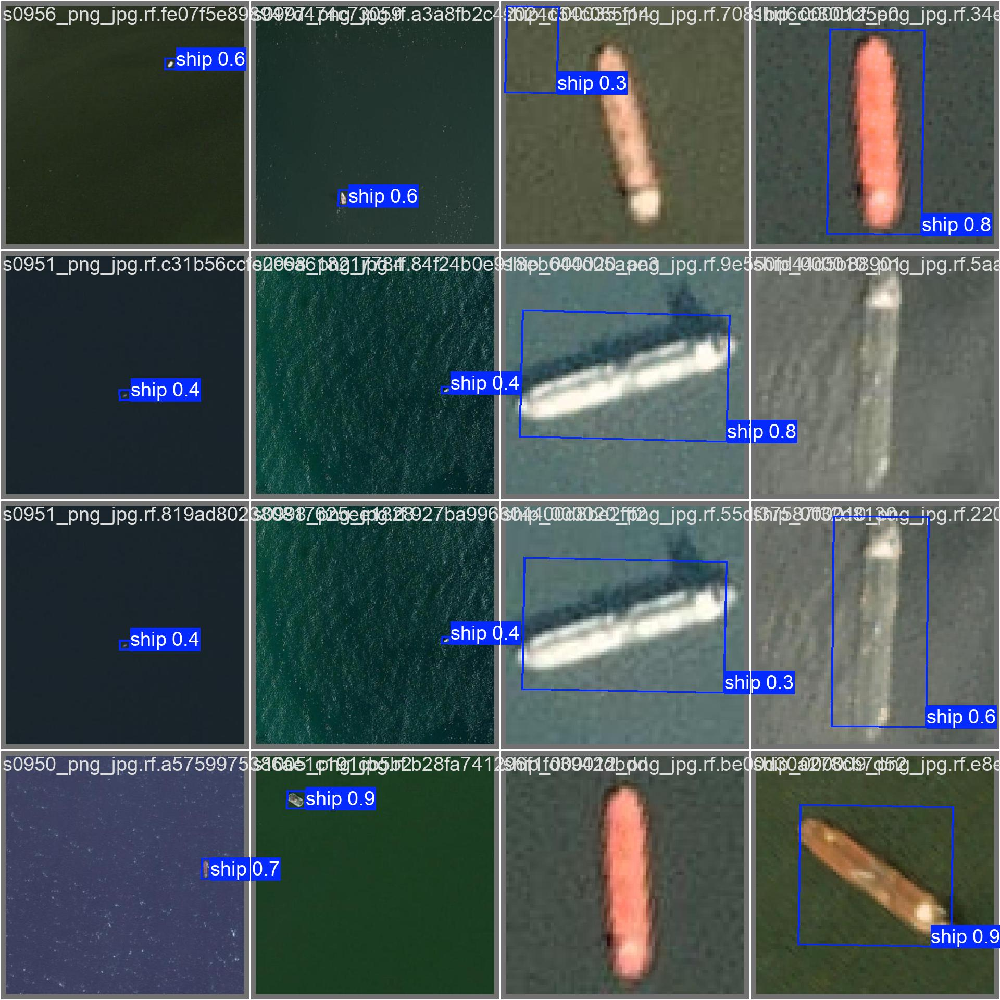

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train2/val_batch1_pred.jpg', width=800)

/content/datasets


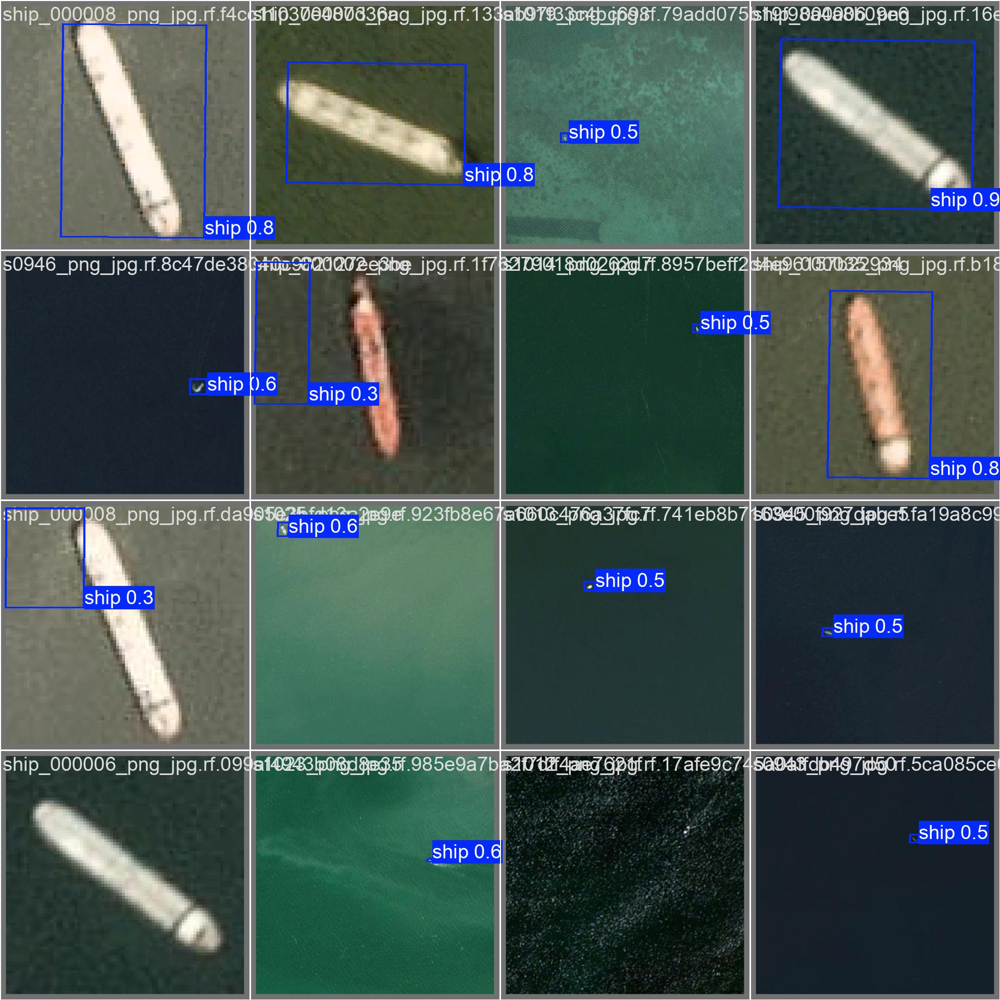

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train/val_batch2_pred.jpg', width=800)

/content/datasets


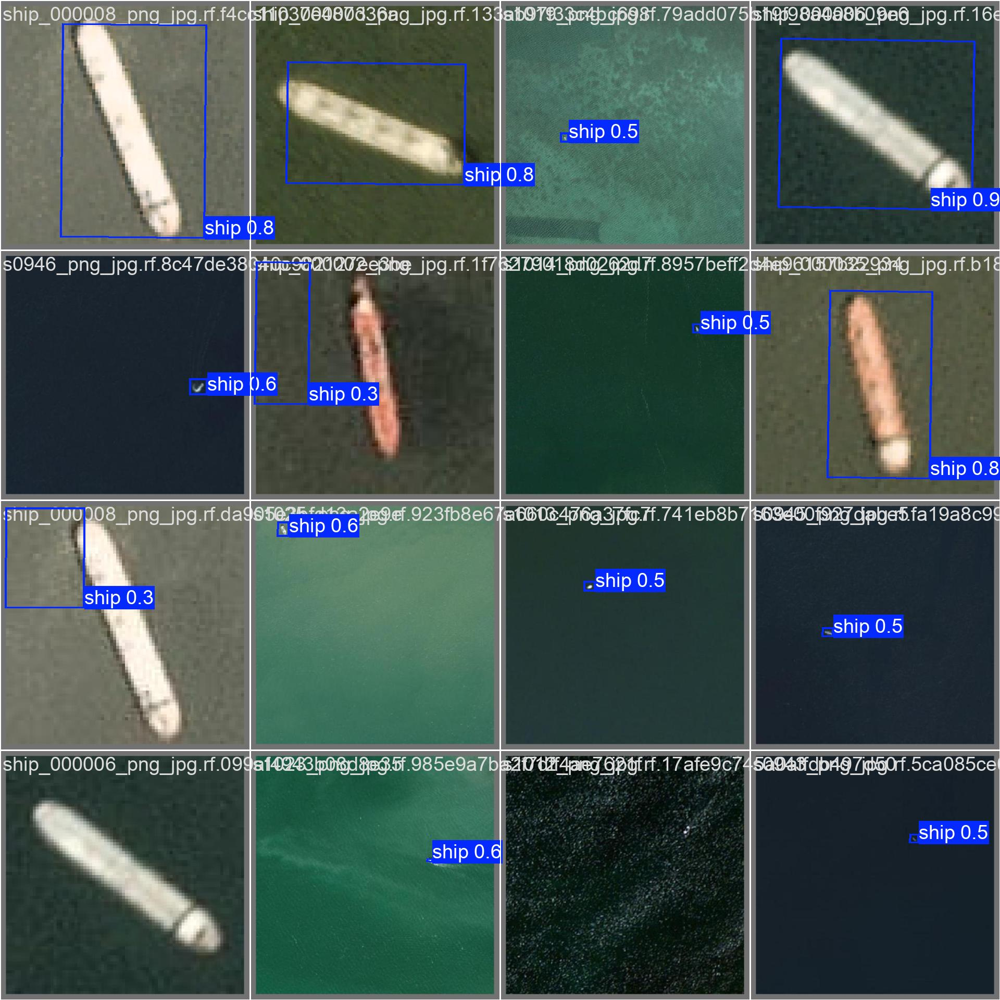

In [ ]:
%cd {HOME}
Image(filename=f'{HOME}/runs/obb/train2/val_batch2_pred.jpg', width=800)

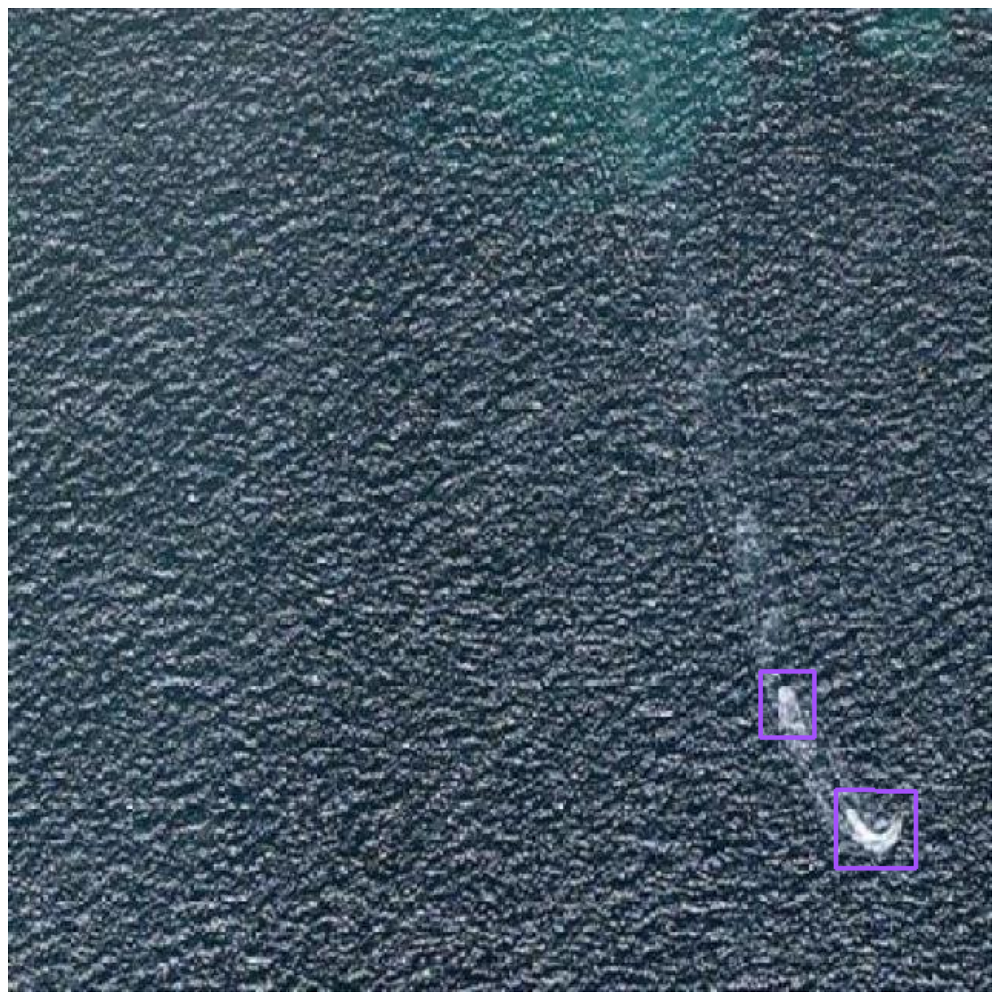

In [ ]:
!pip install supervision==0.18.0 -q

import supervision as sv
import cv2

detections = sv.Detections.from_ultralytics(results[0])

oriented_box_annotator = sv.OrientedBoxAnnotator()
annotated_frame = oriented_box_annotator.annotate(
    scene=cv2.imread(file_name),
    detections=detections
)

sv.plot_image(image=annotated_frame, size=(16, 16))

Our model successfully identified the location of Ship in the image. All Ships have an oriented bounding box that fit the panel closely.